In [127]:
import pandas as pd
import numpy as np
import seaborn as sns
import scipy.stats as scp
import plotly.express as px
import matplotlib.pyplot as plt
from numpy.polynomial.polynomial import polyfit
from collections import Counter

In [128]:
df = pd.read_csv(
    './train_data.csv',
    low_memory=False
)
display(df)

,brand,che_pc_usd,che_perc_gdp,cluster_nl,corporation,country,launch_date,date,drug_id,ind_launch_date,indication,insurance_perc_che,population,prev_perc,price_month,price_unit,public_perc_che,therapeutic_area,target
0,BRAND_354E,1.209114,1.665879,BRAND_354E_COUNTRY_88A3,CORP_D524,COUNTRY_88A3,2014-06-01,2014-06-01,DRUG_ID_8795,-1,['IND_C3B6'],1.893333,1.008039,0.028367,1.006444,1.013784,1.835821,THER_AREA_980E,1.000784
1,BRAND_626D,-1.000000,-1.000000,BRAND_626D_COUNTRY_8B47,CORP_01C7,COUNTRY_8B47,2014-06-01,2014-06-01,DRUG_ID_E66E,2014-09-01 00:00:00,"['IND_1590', 'IND_ECAC']",-1.000000,1.023562,0.000047,-1.000000,1.626677,-1.000000,THER_AREA_96D7,1.000000
2,BRAND_45D9,1.209114,1.665879,BRAND_45D9_COUNTRY_88A3,CORP_39F7,COUNTRY_88A3,2014-06-01,2014-06-01,DRUG_ID_F272,-1,['IND_B2EF'],1.893333,1.008039,0.001502,-1.000000,3.144874,1.835821,THER_AREA_96D7,1.002258
3,BRAND_D724,1.851280,2.051770,BRAND_D724_COUNTRY_445D,CORP_711A,COUNTRY_445D,2014-06-01,2014-06-01,DRUG_ID_1D4E,-1,['IND_BAFB'],1.000000,1.253186,0.001304,-1.000000,1.213446,1.805970,THER_AREA_6CEE,1.068761
4,BRAND_4887,1.791199,2.059130,BRAND_4887_COUNTRY_D8B0,CORP_443D,COUNTRY_D8B0,2014-06-01,2014-06-01,DRUG_ID_AA88,-1,['IND_3F31'],2.013333,1.639352,0.054467,1.018589,1.008708,1.880597,THER_AREA_6CEE,1.036312
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
118912,BRAND_2058,2.074438,2.058055,BRAND_2058_COUNTRY_C8F4,CORP_3C9A,COUNTRY_C8F4,2020-11-01,2022-12-01,DRUG_ID_74A6,-1,['IND_A496'],-1.000000,1.049808,0.095233,1.054007,1.100336,2.029851,THER_AREA_6CEE,1.203657
118913,BRAND_4888,1.756234,1.819485,BRAND_4888_COUNTRY_6F78,CORP_A713,COUNTRY_6F78,2019-07-01,2022-12-01,DRUG_ID_52A5,-1,['IND_617C'],1.173333,1.008985,0.033939,1.008317,1.029630,1.955224,THER_AREA_980E,1.109272
118914,BRAND_0056,1.127497,1.491552,BRAND_0056_COUNTRY_0C7D,CORP_01C7,COUNTRY_0C7D,2018-09-01,2022-12-01,DRUG_ID_D637,-1,['IND_FC21'],1.826667,1.121505,0.012526,1.017259,1.018310,1.926795,THER_AREA_644A,1.343341
118915,BRAND_6200,1.874532,2.020277,BRAND_6200_COUNTRY_89F9,CORP_39F7,COUNTRY_89F9,2020-09-01,2022-12-01,DRUG_ID_B0E9,2020-11-01 00:00:00,['IND_B2EF'],-1.000000,1.520144,0.001334,1.960978,2.490911,1.985847,THER_AREA_96D7,1.266831


In [22]:
df.head(5)

,brand,che_pc_usd,che_perc_gdp,cluster_nl,corporation,country,launch_date,date,drug_id,ind_launch_date,indication,insurance_perc_che,population,prev_perc,price_month,price_unit,public_perc_che,therapeutic_area,target
0,BRAND_354E,1.209114,1.665879,BRAND_354E_COUNTRY_88A3,CORP_D524,COUNTRY_88A3,2014-06-01,2014-06-01,DRUG_ID_8795,-1,['IND_C3B6'],1.893333,1.008039,0.028367,1.006444,1.013784,1.835821,THER_AREA_980E,1.000784
1,BRAND_626D,-1.000000,-1.000000,BRAND_626D_COUNTRY_8B47,CORP_01C7,COUNTRY_8B47,2014-06-01,2014-06-01,DRUG_ID_E66E,2014-09-01 00:00:00,"['IND_1590', 'IND_ECAC']",-1.000000,1.023562,0.000047,-1.000000,1.626677,-1.000000,THER_AREA_96D7,1.000000
2,BRAND_45D9,1.209114,1.665879,BRAND_45D9_COUNTRY_88A3,CORP_39F7,COUNTRY_88A3,2014-06-01,2014-06-01,DRUG_ID_F272,-1,['IND_B2EF'],1.893333,1.008039,0.001502,-1.000000,3.144874,1.835821,THER_AREA_96D7,1.002258
3,BRAND_D724,1.851280,2.051770,BRAND_D724_COUNTRY_445D,CORP_711A,COUNTRY_445D,2014-06-01,2014-06-01,DRUG_ID_1D4E,-1,['IND_BAFB'],1.000000,1.253186,0.001304,-1.000000,1.213446,1.805970,THER_AREA_6CEE,1.068761
4,BRAND_4887,1.791199,2.059130,BRAND_4887_COUNTRY_D8B0,CORP_443D,COUNTRY_D8B0,2014-06-01,2014-06-01,DRUG_ID_AA88,-1,['IND_3F31'],2.013333,1.639352,0.054467,1.018589,1.008708,1.880597,THER_AREA_6CEE,1.036312


In [28]:
total_rows, total_attributes = df.shape
print('Jumlah data:', total_rows)
print("Jumlah atribut:", total_attributes)

df.head()

Jumlah data: 118917
Jumlah atribut: 19


,brand,che_pc_usd,che_perc_gdp,cluster_nl,corporation,country,launch_date,date,drug_id,ind_launch_date,indication,insurance_perc_che,population,prev_perc,price_month,price_unit,public_perc_che,therapeutic_area,target
0,BRAND_354E,1.209114,1.665879,BRAND_354E_COUNTRY_88A3,CORP_D524,COUNTRY_88A3,2014-06-01,2014-06-01,DRUG_ID_8795,-1,['IND_C3B6'],1.893333,1.008039,0.028367,1.006444,1.013784,1.835821,THER_AREA_980E,1.000784
1,BRAND_626D,-1.000000,-1.000000,BRAND_626D_COUNTRY_8B47,CORP_01C7,COUNTRY_8B47,2014-06-01,2014-06-01,DRUG_ID_E66E,2014-09-01 00:00:00,"['IND_1590', 'IND_ECAC']",-1.000000,1.023562,0.000047,-1.000000,1.626677,-1.000000,THER_AREA_96D7,1.000000
2,BRAND_45D9,1.209114,1.665879,BRAND_45D9_COUNTRY_88A3,CORP_39F7,COUNTRY_88A3,2014-06-01,2014-06-01,DRUG_ID_F272,-1,['IND_B2EF'],1.893333,1.008039,0.001502,-1.000000,3.144874,1.835821,THER_AREA_96D7,1.002258
3,BRAND_D724,1.851280,2.051770,BRAND_D724_COUNTRY_445D,CORP_711A,COUNTRY_445D,2014-06-01,2014-06-01,DRUG_ID_1D4E,-1,['IND_BAFB'],1.000000,1.253186,0.001304,-1.000000,1.213446,1.805970,THER_AREA_6CEE,1.068761
4,BRAND_4887,1.791199,2.059130,BRAND_4887_COUNTRY_D8B0,CORP_443D,COUNTRY_D8B0,2014-06-01,2014-06-01,DRUG_ID_AA88,-1,['IND_3F31'],2.013333,1.639352,0.054467,1.018589,1.008708,1.880597,THER_AREA_6CEE,1.036312


In [54]:
# Type & Information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118917 entries, 0 to 118916
Data columns (total 19 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   brand               118917 non-null  object 
 1   che_pc_usd          118917 non-null  float64
 2   che_perc_gdp        118917 non-null  float64
 3   cluster_nl          118917 non-null  object 
 4   corporation         118917 non-null  object 
 5   country             118917 non-null  object 
 6   launch_date         118917 non-null  object 
 7   date                118917 non-null  object 
 8   drug_id             118917 non-null  object 
 9   ind_launch_date     118917 non-null  object 
 10  indication          118917 non-null  object 
 11  insurance_perc_che  118917 non-null  float64
 12  population          118917 non-null  float64
 13  prev_perc           118917 non-null  float64
 14  price_month         118917 non-null  float64
 15  price_unit          118917 non-nul

In [24]:
# Show Only Numerical statistic
df.describe()

,che_pc_usd,che_perc_gdp,insurance_perc_che,population,prev_perc,price_month,price_unit,public_perc_che,target
count,118917.000000,118917.000000,118917.000000,118917.000000,1.189170e+05,118917.000000,118917.000000,118917.000000,118917.000000
mean,1.529389,1.607100,1.008999,1.483680,5.768206e-02,0.912442,1.463305,1.762006,1.420171
std,0.439094,0.537994,1.044154,1.336542,9.163269e-02,1.414511,5.464170,0.303401,1.183330
min,-1.000000,-1.000000,-1.000000,1.000000,5.954162e-07,-1.000000,-1.000000,-1.000000,1.000000
25%,1.179931,1.464849,1.000000,1.038227,2.463952e-03,1.002854,1.011818,1.671642,1.022251
50%,1.472378,1.731474,1.346667,1.238870,1.879598e-02,1.015832,1.085415,1.835821,1.089062
75%,1.816479,1.894139,1.760000,1.506685,8.556676e-02,1.316595,1.420445,1.925373,1.309227
max,2.656913,2.311103,2.040000,12.767484,6.668035e-01,39.343041,535.926517,2.044776,28.576068


In [25]:
print("Non null\n", df.count())

Non null
 brand                 118917
che_pc_usd            118917
che_perc_gdp          118917
cluster_nl            118917
corporation           118917
country               118917
launch_date           118917
date                  118917
drug_id               118917
ind_launch_date       118917
indication            118917
insurance_perc_che    118917
population            118917
prev_perc             118917
price_month           118917
price_unit            118917
public_perc_che       118917
therapeutic_area      118917
target                118917
dtype: int64


In [26]:
# Missing Values

print("Count missing values: \n", df.isnull().sum())

Count missing values: 
 brand                 0
che_pc_usd            0
che_perc_gdp          0
cluster_nl            0
corporation           0
country               0
launch_date           0
date                  0
drug_id               0
ind_launch_date       0
indication            0
insurance_perc_che    0
population            0
prev_perc             0
price_month           0
price_unit            0
public_perc_che       0
therapeutic_area      0
target                0
dtype: int64


In [30]:
# Description for only object
df.describe(include=['object'])

,brand,cluster_nl,corporation,country,launch_date,date,drug_id,ind_launch_date,indication,therapeutic_area
count,118917,118917,118917,118917,118917,118917,118917,118917,118917,118917
unique,591,2716,136,49,103,103,257,123,257,12
top,BRAND_0056,BRAND_354E_COUNTRY_88A3,CORP_01C7,COUNTRY_907E,2016-03-01,2020-08-01,DRUG_ID_3A6F,-1,['IND_3A0D'],THER_AREA_96D7
freq,2366,60,19445,5522,2940,1794,3035,87797,18551,45858


In [32]:
# Description for only float type
df.describe(include=['float64'])

,che_pc_usd,che_perc_gdp,insurance_perc_che,population,prev_perc,price_month,price_unit,public_perc_che,target
count,118917.000000,118917.000000,118917.000000,118917.000000,1.189170e+05,118917.000000,118917.000000,118917.000000,118917.000000
mean,1.529389,1.607100,1.008999,1.483680,5.768206e-02,0.912442,1.463305,1.762006,1.420171
std,0.439094,0.537994,1.044154,1.336542,9.163269e-02,1.414511,5.464170,0.303401,1.183330
min,-1.000000,-1.000000,-1.000000,1.000000,5.954162e-07,-1.000000,-1.000000,-1.000000,1.000000
25%,1.179931,1.464849,1.000000,1.038227,2.463952e-03,1.002854,1.011818,1.671642,1.022251
50%,1.472378,1.731474,1.346667,1.238870,1.879598e-02,1.015832,1.085415,1.835821,1.089062
75%,1.816479,1.894139,1.760000,1.506685,8.556676e-02,1.316595,1.420445,1.925373,1.309227
max,2.656913,2.311103,2.040000,12.767484,6.668035e-01,39.343041,535.926517,2.044776,28.576068


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 118917 entries, 0 to 118916
Data columns (total 19 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   brand               118917 non-null  object 
 1   che_pc_usd          118917 non-null  float64
 2   che_perc_gdp        118917 non-null  float64
 3   cluster_nl          118917 non-null  object 
 4   corporation         118917 non-null  object 
 5   country             118917 non-null  object 
 6   launch_date         118917 non-null  object 
 7   date                118917 non-null  object 
 8   drug_id             118917 non-null  object 
 9   ind_launch_date     118917 non-null  object 
 10  indication          118917 non-null  object 
 11  insurance_perc_che  118917 non-null  float64
 12  population          118917 non-null  float64
 13  prev_perc           118917 non-null  float64
 14  price_month         118917 non-null  float64
 15  price_unit          118917 non-nul

In [59]:
# ---------------------- Identifier -------------------------

In [46]:
# Brand 
df['brand'].value_counts()

brand
BRAND_0056    2366
BRAND_62C7    1875
BRAND_7A2E    1762
BRAND_A12A    1761
BRAND_4048    1642
              ... 
BRAND_68E1       1
BRAND_0417       1
BRAND_47A8       1
BRAND_E02F       1
BRAND_ECB8       1
Name: count, Length: 591, dtype: int64

In [98]:
print("Unique brand: ", df['brand'].nunique())

Unique brand:  591


In [100]:
# Drug ID 
df['drug_id'].value_counts()

drug_id
DRUG_ID_3A6F    3035
DRUG_ID_D637    2567
DRUG_ID_B15F    1852
DRUG_ID_30F8    1841
DRUG_ID_B633    1828
                ... 
DRUG_ID_6705       1
DRUG_ID_7410       1
DRUG_ID_B236       1
DRUG_ID_B028       1
DRUG_ID_C604       1
Name: count, Length: 257, dtype: int64

In [101]:
print("Unique drug: ", df['drug_id'].nunique())

Unique drug:  257


In [48]:
# Country 
df['country'].value_counts()

country
COUNTRY_907E    5522
COUNTRY_3AD0    5002
COUNTRY_89F9    4811
COUNTRY_53A5    4782
COUNTRY_D8B0    4654
COUNTRY_445D    4547
COUNTRY_4242    4425
COUNTRY_1007    4119
COUNTRY_9891    3891
COUNTRY_6F78    3810
COUNTRY_0309    3760
COUNTRY_B6AE    3654
COUNTRY_D5B9    3486
COUNTRY_4442    3345
COUNTRY_06E4    3260
COUNTRY_8DBB    3236
COUNTRY_221C    3216
COUNTRY_FA79    3183
COUNTRY_4253    3169
COUNTRY_EA71    3049
COUNTRY_4D48    2908
COUNTRY_5180    2903
COUNTRY_6C16    2613
COUNTRY_88A3    2370
COUNTRY_5FEB    2306
COUNTRY_C8F4    2239
COUNTRY_6B71    2219
COUNTRY_B835    2162
COUNTRY_9488    2111
COUNTRY_A67D    1983
COUNTRY_0C7D    1923
COUNTRY_2E65    1684
COUNTRY_3536    1572
COUNTRY_E319    1503
COUNTRY_84C8    1307
COUNTRY_C51E    1303
COUNTRY_C89B    1156
COUNTRY_AE54    1151
COUNTRY_EF33    1078
COUNTRY_8B47     741
COUNTRY_1033     640
COUNTRY_3F0E     456
COUNTRY_7D31     391
COUNTRY_458E     375
COUNTRY_5A54     359
COUNTRY_77DA     214
COUNTRY_4647     118
COUNT

In [49]:
print("Unique country: ", df['country'].nunique())

Unique country:  49


In [52]:
# Date
df['date'].value_counts()

date
2020-08-01    1794
2020-01-01    1791
2020-10-01    1789
2020-09-01    1788
2020-03-01    1783
              ... 
2014-10-01      95
2014-09-01      78
2014-08-01      49
2014-07-01      29
2014-06-01      12
Name: count, Length: 103, dtype: int64

In [53]:
print("Unique Date: ", df['date'].nunique())

Unique Date:  103


In [56]:
# Cluster NL
df['cluster_nl'].value_counts()

cluster_nl
BRAND_354E_COUNTRY_88A3    60
BRAND_A12A_COUNTRY_D5B9    60
BRAND_DBFB_COUNTRY_907E    60
BRAND_0056_COUNTRY_3AD0    60
BRAND_FCB2_COUNTRY_6B71    60
                           ..
BRAND_2CB8_COUNTRY_D5B9     1
BRAND_7202_COUNTRY_B6AE     1
BRAND_F2F2_COUNTRY_B6AE     1
BRAND_2205_COUNTRY_5FEB     1
BRAND_3938_COUNTRY_907E     1
Name: count, Length: 2716, dtype: int64

In [57]:
print("Unique Cluster NL: ", df['date'].nunique())

Unique Cluster NL:  103


In [60]:
# ----------------------  Drug-Related Features -------------------------

In [61]:
# Corporation
df['corporation'].value_counts()

corporation
CORP_01C7    19445
CORP_5CBD     9004
CORP_C868     7771
CORP_8F4F     6502
CORP_A713     5879
             ...  
CORP_7527       12
CORP_3573        2
CORP_F9A9        1
CORP_2F56        1
CORP_FE01        1
Name: count, Length: 136, dtype: int64

In [62]:
df['corporation'].unique().tolist()

['CORP_D524',
 'CORP_01C7',
 'CORP_39F7',
 'CORP_711A',
 'CORP_443D',
 'CORP_B65D',
 'CORP_7E54',
 'CORP_8F4F',
 'CORP_A278',
 'CORP_5CBD',
 'CORP_6095',
 'CORP_49C9',
 'CORP_615D',
 'CORP_7883',
 'CORP_C868',
 'CORP_8E0A',
 'CORP_CF96',
 'CORP_A682',
 'CORP_2D09',
 'CORP_995C',
 'CORP_ED1F',
 'CORP_1549',
 'CORP_9AE0',
 'CORP_CFA7',
 'CORP_E8F3',
 'CORP_3045',
 'CORP_A821',
 'CORP_E8B1',
 'CORP_1F89',
 'CORP_AF60',
 'CORP_CDB5',
 'CORP_B3B2',
 'CORP_4E60',
 'CORP_CC42',
 'CORP_3650',
 'CORP_A4B5',
 'CORP_2F31',
 'CORP_A713',
 'CORP_BBDC',
 'CORP_FC5F',
 'CORP_E1E0',
 'CORP_641C',
 'CORP_60A7',
 'CORP_D2B7',
 'CORP_C043',
 'CORP_90D7',
 'CORP_2BCC',
 'CORP_F82D',
 'CORP_1E86',
 'CORP_7D26',
 'CORP_A979',
 'CORP_43CC',
 'CORP_C3C7',
 'CORP_D063',
 'CORP_4AA4',
 'CORP_9F84',
 'CORP_2A6D',
 'CORP_DF1B',
 'CORP_7FCD',
 'CORP_51C0',
 'CORP_753D',
 'CORP_AC82',
 'CORP_B474',
 'CORP_3C09',
 'CORP_09BB',
 'CORP_E62E',
 'CORP_8AA3',
 'CORP_4EBC',
 'CORP_115D',
 'CORP_750B',
 'CORP_E9FE',
 'CORP

In [64]:
# Ind Launch Date
df['ind_launch_date'].value_counts()

ind_launch_date
-1                     87797
2019-11-01 00:00:00     2234
2020-03-01 00:00:00     1904
2019-08-01 00:00:00     1465
2020-01-01 00:00:00     1154
                       ...  
2015-08-01 00:00:00        2
2011-10-01 00:00:00        1
2011-02-01 00:00:00        1
2018-09-01 00:00:00        1
2023-02-01 00:00:00        1
Name: count, Length: 123, dtype: int64

In [65]:
# Corporation
df['indication'].value_counts()

indication
['IND_3A0D']                                                    18551
['IND_617C']                                                    11425
['IND_B2EF']                                                     5826
['IND_BAFB']                                                     5611
['IND_F338']                                                     4865
                                                                ...  
['IND_7C11', 'IND_B2EF', 'IND_C829', 'IND_5257']                    3
['IND_F1DB', 'IND_B2EF', 'IND_C829', 'IND_7C11', 'IND_5257']        3
['IND_CECE']                                                        2
['IND_5586', 'IND_8EA5']                                            1
['IND_D082', 'IND_528C']                                            1
Name: count, Length: 257, dtype: int64

In [66]:
print("Unique indication: ", df['country'].nunique())

Unique indication:  49


In [67]:
# ----------------------  Drug, Country, Date & Target -------------------------

In [68]:
pivot_table = df.pivot_table(values='target', index='country', columns='date', aggfunc='sum', fill_value=0)
print(pivot_table)

date          2014-06-01  2014-07-01  2014-08-01  2014-09-01  2014-10-01  \
country                                                                    
COUNTRY_0309    0.000000    0.000000    0.000000    0.000000    1.015413   
COUNTRY_06E4    0.000000    1.000385    1.000878    1.001323    1.001964   
COUNTRY_0C7D    0.000000    0.000000    0.000000    0.000000    0.000000   
COUNTRY_1007    1.028692    1.044242    2.076137    3.152355    3.235792   
COUNTRY_1033    0.000000    0.000000    0.000000    0.000000    0.000000   
COUNTRY_221C    0.000000    0.000000    0.000000    1.000628    1.003119   
COUNTRY_2E65    0.000000    0.000000    1.000361    3.002968    3.008505   
COUNTRY_3536    0.000000    0.000000    1.001505    1.006312    1.006521   
COUNTRY_3AD0    1.030898    1.054480    2.059718    3.080876    3.107561   
COUNTRY_3F0E    0.000000    0.000000    0.000000    0.000000    1.003653   
COUNTRY_4242    0.000000    3.217505    3.260118    5.413185    6.599526   
COUNTRY_4253

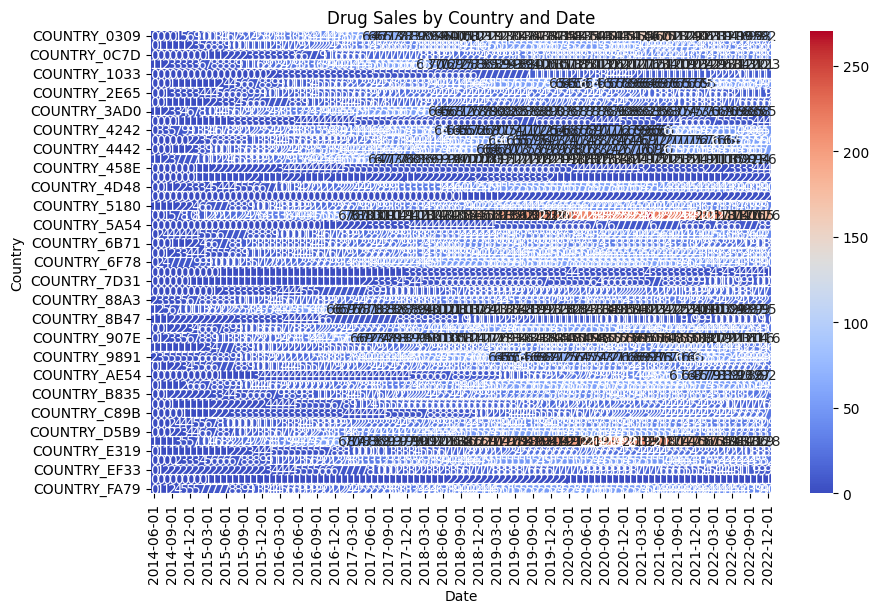

In [69]:

# Plot heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, annot=True, cmap="coolwarm", fmt=".0f")
plt.title("Drug Sales by Country and Date")
plt.xlabel("Date")
plt.ylabel("Country")
plt.show()

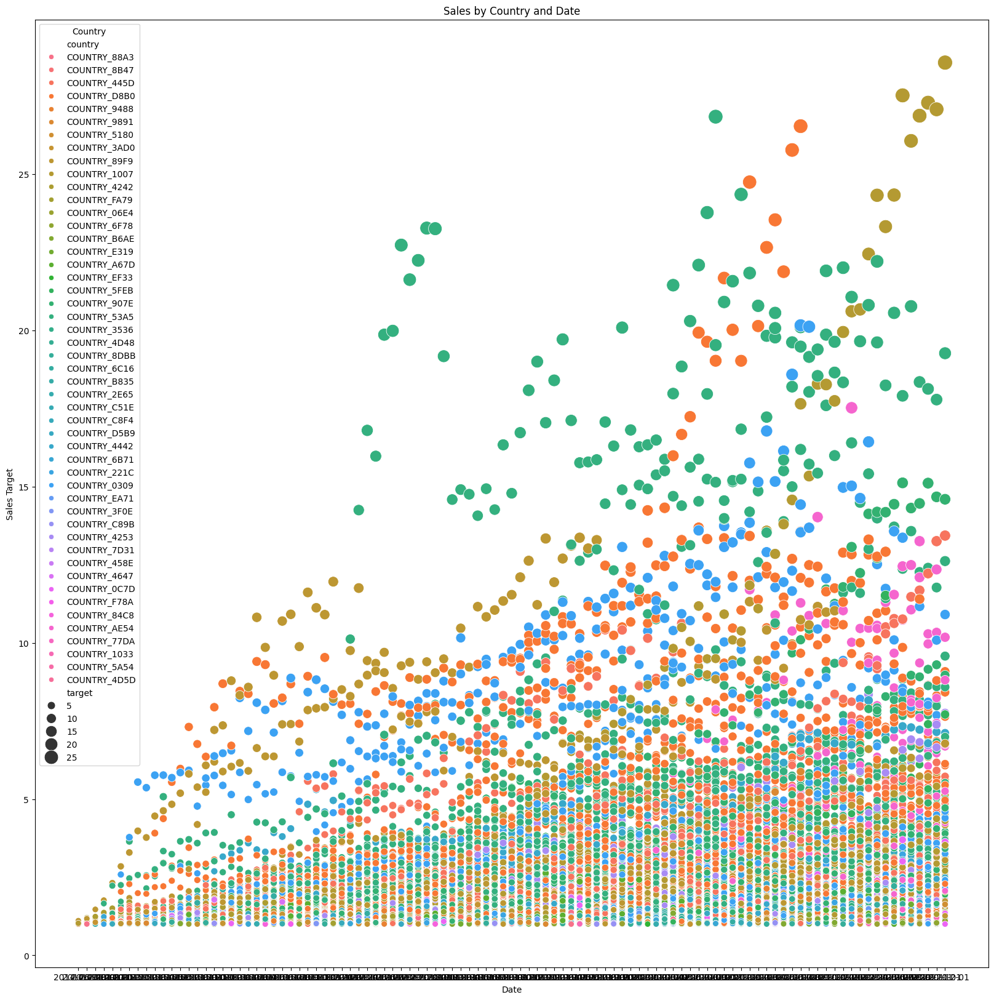

In [82]:
# Country And Sales
plt.figure(figsize=(20, 20))
sns.scatterplot(data=df, x='date', y='target', hue='country', size='target', sizes=(50, 300))
plt.title("Sales by Country and Date")
plt.xlabel("Date")
plt.ylabel("Sales Target")
plt.legend(title="Country")
plt.show()


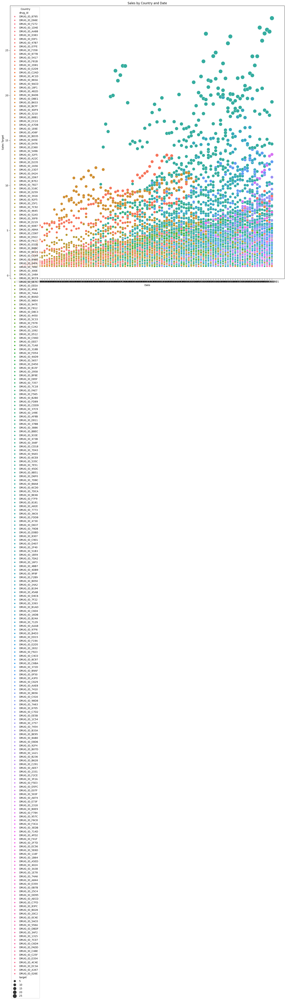

In [83]:
# Scatter plot
plt.figure(figsize=(20, 20))
sns.scatterplot(data=df, x='date', y='target', hue='drug_id', size='target', sizes=(50, 300))
plt.title("Sales by Country and Date")
plt.xlabel("Date")
plt.ylabel("Sales Target")
plt.legend(title="Country")
plt.show()


In [111]:
# Group by country and drug_id, then sum target values
grouped = df.groupby(['country', 'drug_id'])['target'].sum().reset_index()

# Find the most popular drug in each country
most_popular = grouped.loc[grouped.groupby('country')['target'].idxmax()]
most_popular_sorted = most_popular.sort_values(by='target', ascending=False)
# most_popular.set_index('country', inplace=True)
print(most_popular_sorted)

           country       drug_id       target
1015  COUNTRY_53A5  DRUG_ID_7D8C  1004.377031
242   COUNTRY_1007  DRUG_ID_B8A8   718.976403
2252  COUNTRY_D8B0  DRUG_ID_B8A8   607.401715
33    COUNTRY_0309  DRUG_ID_7D8C   576.900547
1433  COUNTRY_89F9  DRUG_ID_5417   487.166193
1647  COUNTRY_907E  DRUG_ID_B8A8   451.414051
778   COUNTRY_445D  DRUG_ID_5417   346.830513
1852  COUNTRY_AE54  DRUG_ID_16F3   340.135949
707   COUNTRY_4442  DRUG_ID_7D8C   304.826510
664   COUNTRY_4253  DRUG_ID_B8A8   240.395372
1786  COUNTRY_9891  DRUG_ID_B8A8   188.877383
1144  COUNTRY_6B71  DRUG_ID_3A6F   170.709716
861   COUNTRY_4D48  DRUG_ID_3A6F   170.351064
2413  COUNTRY_FA79  DRUG_ID_3A6F   155.088826
1190  COUNTRY_6C16  DRUG_ID_3A6F   153.102726
1121  COUNTRY_5FEB  DRUG_ID_B8A8   151.789934
88    COUNTRY_06E4  DRUG_ID_3A6F   141.648479
1706  COUNTRY_9488  DRUG_ID_7D8C   141.151589
482   COUNTRY_3AD0  DRUG_ID_B8A8   138.315129
2107  COUNTRY_C8F4  DRUG_ID_B8A8   136.756138
1829  COUNTRY_A67D  DRUG_ID_7D8C  

In [112]:
# Count occurrences of each drug per country
grouped_count = df.groupby(['country', 'drug_id']).size().reset_index(name='count')

# Find the most popular drug (by count) in each country
most_popular_by_count = grouped_count.loc[grouped_count.groupby('country')['count'].idxmax()]
# most_popular_by_count.set_index('country', inplace=True)
most_popular_by_count_sorted = most_popular_by_count.sort_values(by='count', ascending=False)
print(most_popular_by_count_sorted)


           country       drug_id  count
861   COUNTRY_4D48  DRUG_ID_3A6F    155
2413  COUNTRY_FA79  DRUG_ID_3A6F    150
770   COUNTRY_445D  DRUG_ID_3A6F    120
2375  COUNTRY_EF33  DRUG_ID_3A6F    120
2208  COUNTRY_D8B0  DRUG_ID_3A6F    120
1599  COUNTRY_907E  DRUG_ID_3A6F    120
88    COUNTRY_06E4  DRUG_ID_3A6F    120
1190  COUNTRY_6C16  DRUG_ID_3A6F    120
1144  COUNTRY_6B71  DRUG_ID_3A6F    120
1077  COUNTRY_5A54  DRUG_ID_3A6F    120
20    COUNTRY_0309  DRUG_ID_3A6F    120
201   COUNTRY_1007  DRUG_ID_3A6F    119
2329  COUNTRY_EA71  DRUG_ID_3A6F    107
1525  COUNTRY_8DBB  DRUG_ID_3A6F    100
1304  COUNTRY_77DA  DRUG_ID_D637     94
617   COUNTRY_4253  DRUG_ID_0383     60
1969  COUNTRY_B835  DRUG_ID_04FA     60
1680  COUNTRY_9488  DRUG_ID_0383     60
1729  COUNTRY_9891  DRUG_ID_032B     60
1809  COUNTRY_A67D  DRUG_ID_07FE     60
1860  COUNTRY_AE54  DRUG_ID_4645     60
1887  COUNTRY_B6AE  DRUG_ID_0259     60
2044  COUNTRY_C89B  DRUG_ID_18F1     60
2015  COUNTRY_C51E  DRUG_ID_1D4E     60


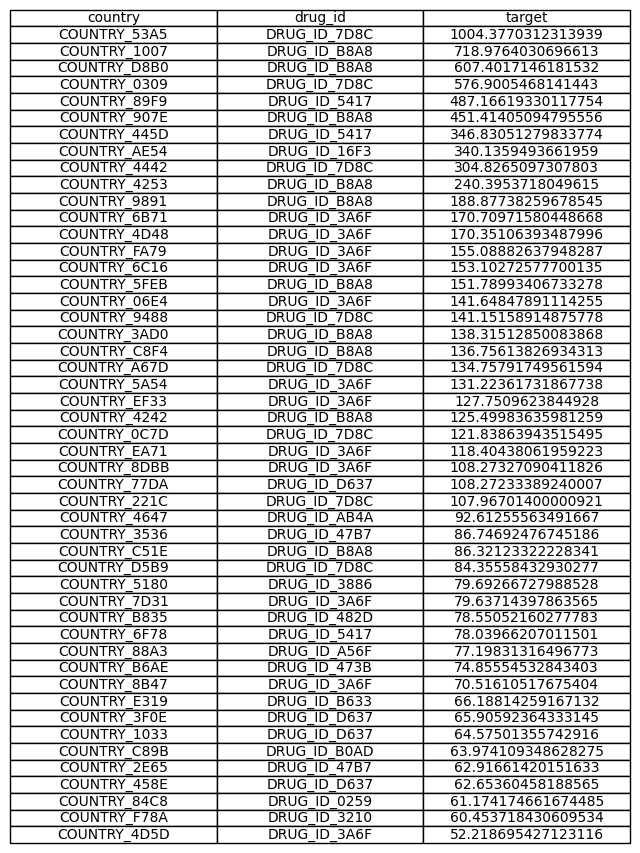

In [113]:
# Plot most_popular as a table
fig, ax = plt.subplots(figsize=(8, 4))
ax.axis('tight')
ax.axis('off')
table_data = most_popular_sorted.values
table_columns = most_popular_sorted.columns

# Create the table on the plot
table = ax.table(cellText=table_data, colLabels=table_columns, loc='center', cellLoc='center')

# Display the table for most_popular
plt.savefig("most_popular_by_target.png", bbox_inches='tight', dpi=300)
plt.show()

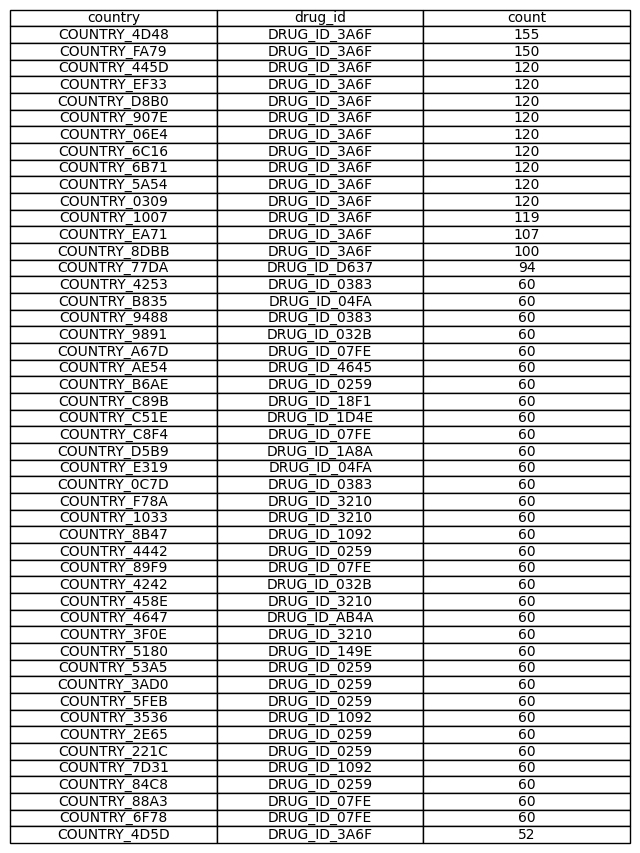

In [115]:
# Plot most_popular_by_count as a table
fig, ax = plt.subplots(figsize=(8, 4))
ax.axis('tight')
ax.axis('off')
table_data = most_popular_by_count_sorted.values
table_columns = most_popular_by_count_sorted.columns

# Create the table on the plot
table = ax.table(cellText=table_data, colLabels=table_columns, loc='center', cellLoc='center')

# Display the table for most_popular_by_count
plt.savefig("most_popular_by_count.png", bbox_inches='tight', dpi=300)
plt.show()

In [117]:
# Count how many values in 'price_per_month' are below 0
below_zero_count = (df['price_month'] < 0).sum()

print(f"Count of 'price_per_month' is negative: {below_zero_count}")

Count of 'price_per_month' is negative: 24152


In [129]:
from ast import literal_eval


# Convert string representations of lists to actual lists
df['indication'] = df['indication'].apply(literal_eval)

# Flatten the 'indication' column into a single list
all_indications = [ind for sublist in df['indication'] for ind in sublist]

# Count occurrences of each unique indication
indication_counts = Counter(all_indications)

# Convert the result into a sorted DataFrame
indication_count_df = pd.DataFrame(indication_counts.items(), columns=['indication', 'count']).sort_values(by='count', ascending=False)

print(indication_count_df)

    indication  count
9     IND_3A0D  20621
14    IND_617C  12986
3     IND_B2EF  11227
10    IND_F338   7303
70    IND_DA0B   7185
..         ...    ...
148   IND_BE80     22
149   IND_FD5B     22
152   IND_99E5     14
147   IND_46E5      7
154   IND_CECE      2

[155 rows x 2 columns]


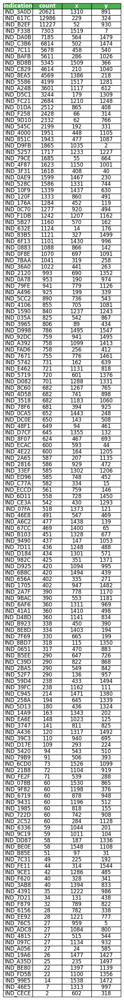

In [147]:
fig, ax = plt.subplots(figsize=(4, 4))
ax.axis('off')

# Prepare table data
table_data = indication_count_df.values
table_columns = indication_count_df.columns

# Create the table
table = ax.table(
    cellText=table_data, 
    colLabels=table_columns, 
    loc='center', 
    cellLoc='center'
)

# Style the header
header_cells = table.get_celld()  # Get all cells
for (row, col), cell in header_cells.items():
    if row == 0:  # Header row
        cell.set_facecolor('#4CAF50')  # Green header
        cell.set_text_props(color='white', weight='bold')  # White bold text
        cell.set_height(0.05)  # Adjust header height

# Add y-axis spacing
table.auto_set_font_size(False)
table.set_fontsize(12)  # Set a readable font size
table.scale(1.2, 1.2)  # Scale x and y

# Save and show the plot
plt.savefig("indication_count.png", bbox_inches='tight', dpi=300)
plt.show()

/var/folders/66/rq8b0mrn2556f1qx80fwjkqw0000gn/T/ipykernel_10235/3783893287.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_10_df['x'] = x_positions
/var/folders/66/rq8b0mrn2556f1qx80fwjkqw0000gn/T/ipykernel_10235/3783893287.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_10_df['y'] = y_positions


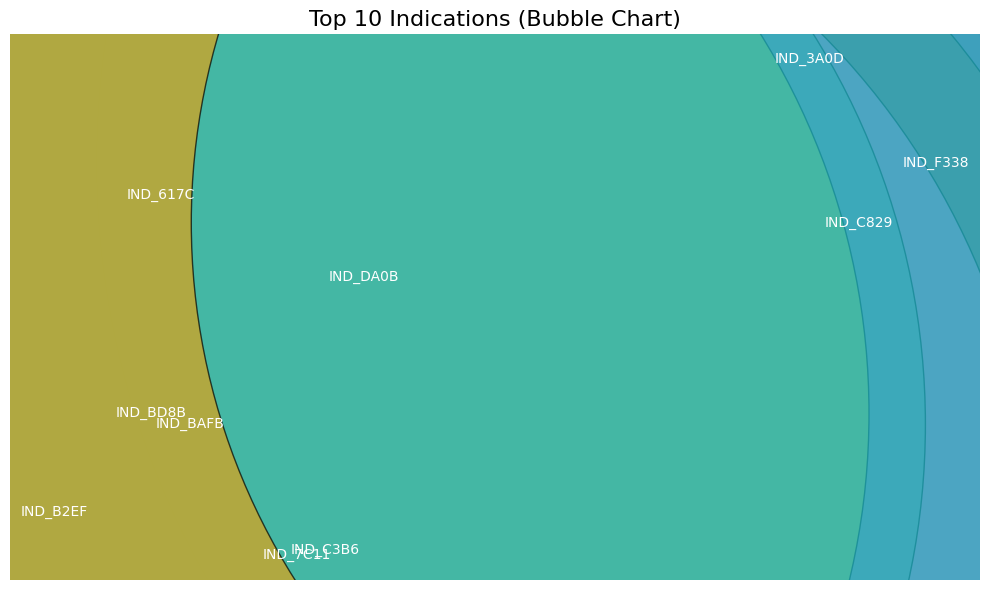

In [146]:
import random
# Filter for top 10 indications
top_10_df = indication_count_df.head(10)

# Generate random positions for x and y axes
num_indications = len(top_10_df)
random.seed(42)  # For reproducibility
x_positions = random.sample(range(1, num_indications * 10), num_indications)
y_positions = random.sample(range(1, num_indications * 10), num_indications)

# Add x and y positions to the DataFrame
top_10_df['x'] = x_positions
top_10_df['y'] = y_positions

# Assign unique colors to each bubble
colors = plt.cm.tab10(range(num_indications))  # Use a colormap for distinct colors

# Plot the bubble chart
plt.figure(figsize=(10, 6))
plt.scatter(
    x=top_10_df['x'],
    y=top_10_df['y'],
    s=top_10_df['count'] * 200,  # Bubble size proportional to count
    c=colors,
    alpha=0.7,
    edgecolors='black'
)

# Add labels for bubbles
for i, row in top_10_df.iterrows():
    plt.text(row['x'], row['y'], row['indication'], ha='center', va='center', fontsize=10, color='white')

# Hide axes (optional)
plt.axis('off')

# Add a title
plt.title('Top 10 Indications (Bubble Chart)', fontsize=16)

# Show plot
plt.tight_layout()
plt.show()

In [141]:
# Indication x Country

df_exploded = df.explode('indication')

# Group by country and indication, then count occurrences
grouped_counts = df_exploded.groupby(['country', 'indication']).size().reset_index(name='count')
grouped_counts_sort = grouped_counts.sort_values(by='count', ascending=False)

# Display the grouped and counted data
print(grouped_counts)

           country indication  count
0     COUNTRY_0309   IND_035A     60
1     COUNTRY_0309   IND_0651     44
2     COUNTRY_0309   IND_07FA     53
3     COUNTRY_0309   IND_0883     31
4     COUNTRY_0309   IND_0A78     56
...            ...        ...    ...
1952  COUNTRY_FA79   IND_F1DB     32
1953  COUNTRY_FA79   IND_F258     59
1954  COUNTRY_FA79   IND_F338    371
1955  COUNTRY_FA79   IND_FAD6     59
1956  COUNTRY_FA79   IND_FC21     28

[1957 rows x 3 columns]


ValueError: Image size of 1455x117549 pixels is too large. It must be less than 2^16 in each direction.

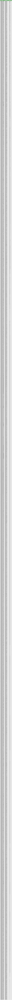

In [145]:
fig, ax = plt.subplots(figsize=(5,5))
ax.axis('off')

# Prepare table data
table_data = grouped_counts_sort.values
table_columns = grouped_counts_sort.columns

# Create the table
table = ax.table(
    cellText=table_data, 
    colLabels=table_columns, 
    loc='center', 
    cellLoc='center'
)

# Style the header
header_cells = table.get_celld()  # Get all cells
for (row, col), cell in header_cells.items():
    if row == 0:  # Header row
        cell.set_facecolor('#4CAF50')  # Green header
        cell.set_text_props(color='white', weight='bold')  # White bold text
        cell.set_height(0.05)  # Adjust header height

# Add y-axis spacing
table.auto_set_font_size(False)
table.set_fontsize(12)  # Set a readable font size
table.scale(1.2, 1.2)  # Scale x and y

# Save and show the plot
plt.savefig("indication_count.png", bbox_inches='tight', dpi=300)
plt.show()